In [0]:
from pyspark.sql import SparkSession

In [0]:
import zipfile
import pandas as pd

In [0]:
sp=SparkSession.builder.appName("Parking_tickets_EDA").getOrCreate()

In [0]:
pdf = sp.read.csv('/FileStore/tables/parking_tickets_2017_reduced.csv',sep=',',header='true',inferSchema='true')
#/FileStore/tables/parking_tickets_2017_reduced.csv
#/FileStore/tables/parking_tickets_2017_reduced.csv
pdf.display()

Summons Number,Plate ID,Registration State,Plate Type,Issue Date,Violation Code,Vehicle Body Type,Vehicle Make,Issuing Agency,Street Code1,Street Code2,Street Code3,Vehicle Expiration Date,Violation Location,Violation Precinct,Issuer Precinct,Issuer Code,Issuer Command,Issuer Squad,Violation Time,Time First Observed,Violation County,Violation In Front Of Or Opposite,House Number,Street Name,Intersecting Street,Date First Observed,Law Section,Sub Division,Violation Legal Code,Days Parking In Effect,From Hours In Effect,To Hours In Effect,Vehicle Color,Unregistered Vehicle?,Vehicle Year,Meter Number,Feet From Curb,Violation Post Code,Violation Description,No Standing or Stopping Violation,Hydrant Violation,Double Parking Violation
5092469481,GZH7067,NY,PAS,2016-07-10,7,SUBN,TOYOT,V,0,0,0,0,null,0,0,0,null,null,0143A,null,BX,null,null,ALLERTON AVE (W/B) @,BARNES AVE,0,1111,D,T,null,null,null,GY,null,2001,null,0,null,FAILURE TO STOP AT RED LIGHT,null,null,null
5092451658,GZH7067,NY,PAS,2016-07-08,7,SUBN,TOYOT,V,0,0,0,0,null,0,0,0,null,null,0400P,null,BX,null,null,ALLERTON AVE (W/B) @,BARNES AVE,0,1111,D,T,null,null,null,GY,null,2001,null,0,null,FAILURE TO STOP AT RED LIGHT,null,null,null
4006265037,FZX9232,NY,PAS,2016-08-23,5,SUBN,FORD,V,0,0,0,0,null,0,0,0,null,null,0233P,null,BX,null,null,SB WEBSTER AVE @ E 1,94TH ST,0,1111,C,T,null,null,null,BK,null,2004,null,0,null,BUS LANE VIOLATION,null,null,null
8478629828,66623ME,NY,COM,2017-06-14,47,REFG,MITSU,T,10610,34330,34350,20180630,14,14,14,359594,T102,J,1120A,null,NY,O,330,7th Ave,null,0,408,l2,null,Y,0700A,0700P,WH,null,2007,null,0,4,47-Double PKG-Midtown,null,null,null
7868300310,37033JV,NY,COM,2016-11-21,69,DELV,INTER,T,10510,34310,34330,20170228,13,13,13,364832,T102,M,0555P,null,NY,F,799,6th Ave,null,0,408,h1,null,Y,0700A,0700P,WHITE,null,2007,null,0,31 6,69-Failure to Disp Muni Recpt,null,null,null
5096917368,FZD8593,NY,PAS,2017-06-13,7,SUBN,ME/BE,V,0,0,0,0,null,0,0,0,null,null,0852P,null,QN,null,null,NORTHERN BLVD (E/B),@ MARATHON PKWY,0,1111,D,T,null,null,null,WH,null,2012,null,0,null,FAILURE TO STOP AT RED LIGHT,null,null,null
1413609545,X20DCM,NJ,PAS,2016-08-03,40,SDN,TOYOT,P,54070,39430,54930,0,71,71,71,960290,71,0,0215A,null,K,F,439,KINGSTON,null,0,408,C3,null,BBBBBBB,ALL,ALL,WHITE,0,0,-,1,null,null,null,null,null
4628525523,326SF9,MA,PAS,2016-12-21,36,UT,BMW,V,0,0,0,0,null,0,0,0,null,null,0758A,null,BX,null,null,EB E GUN HILL RD @ B,ARNES AVE,0,1180,B,T,null,null,null,null,null,2001,null,0,null,PHTO SCHOOL ZN SPEED VIOLATION,null,null,null
4627113330,HCA5464,NY,OMS,2016-11-21,36,SUBN,DODGE,V,0,0,0,0,null,0,0,0,null,null,1005A,null,QN,null,null,NB BAISLEY BLVD @ 15,5TH ST,0,1180,B,T,null,null,null,BK,null,2016,null,0,null,PHTO SCHOOL ZN SPEED VIOLATION,null,null,null
4006478550,VAD7274,VA,PAS,2016-10-05,5,4D,BMW,V,0,0,0,0,null,0,0,0,null,null,0845A,null,BX,null,null,SB WEBSTER AVE @ E 2,04TH ST,0,1111,C,T,null,null,null,BLK,null,2008,null,0,null,BUS LANE VIOLATION,null,null,null


In [0]:
len(pdf.columns)

Out[46]: 43

In [0]:
pdf.count()

Out[47]: 1048575

In [0]:
pdf.printSchema()

root
 |-- Summons Number: long (nullable = true)
 |-- Plate ID: string (nullable = true)
 |-- Registration State: string (nullable = true)
 |-- Plate Type: string (nullable = true)
 |-- Issue Date: date (nullable = true)
 |-- Violation Code: integer (nullable = true)
 |-- Vehicle Body Type: string (nullable = true)
 |-- Vehicle Make: string (nullable = true)
 |-- Issuing Agency: string (nullable = true)
 |-- Street Code1: integer (nullable = true)
 |-- Street Code2: integer (nullable = true)
 |-- Street Code3: integer (nullable = true)
 |-- Vehicle Expiration Date: integer (nullable = true)
 |-- Violation Location: integer (nullable = true)
 |-- Violation Precinct: integer (nullable = true)
 |-- Issuer Precinct: integer (nullable = true)
 |-- Issuer Code: integer (nullable = true)
 |-- Issuer Command: string (nullable = true)
 |-- Issuer Squad: string (nullable = true)
 |-- Violation Time: string (nullable = true)
 |-- Time First Observed: string (nullable = true)
 |-- Violation County

In [0]:
data = pdf.dropDuplicates()

In [0]:
data.describe("Summons Number").show()

+-------+--------------------+
|summary|      Summons Number|
+-------+--------------------+
|  count|             1048575|
|   mean|  6.86400717833264E9|
| stddev|2.2998935503680263E9|
|    min|          1005796490|
|    max|          8585502022|
+-------+--------------------+



In [0]:
data.describe("Plate ID").show()

+-------+--------+
|summary|Plate ID|
+-------+--------+
|  count| 1048575|
|   mean|Infinity|
| stddev|     NaN|
|    min|   #1MOM|
|    max| [T1293X|
+-------+--------+



In [0]:
data.describe("Registration State").show()

+-------+------------------+
|summary|Registration State|
+-------+------------------+
|  count|           1048575|
|   mean|              99.0|
| stddev|               0.0|
|    min|                99|
|    max|                WY|
+-------+------------------+



In [0]:
data.describe("Violation Code").show()

+-------+------------------+
|summary|    Violation Code|
+-------+------------------+
|  count|           1048575|
|   mean|34.740402927782945|
| stddev|19.320248118137656|
|    min|                 0|
|    max|                99|
+-------+------------------+



In [0]:
data.describe("Vehicle Body Type").show()

+-------+-------------------+
|summary|  Vehicle Body Type|
+-------+-------------------+
|  count|            1044582|
|   mean|  3.927164333851737|
| stddev|0.43639612850352416|
|    min|                  0|
|    max|                 ZL|
+-------+-------------------+



In [0]:
data=data.fillna('0')

In [0]:
data.createOrReplaceTempView("datav")

In [0]:
nullrc=sp.sql('select count(*) from datav where `Summons Number` is null or `Plate ID` is null or `Registration State` is null or `Issue Date` is null or `Violation Code` is null or `Vehicle Body Type` is null or `Vehicle Make` is null or `Violation Precinct` is null or `Issuer Precinct` is null or `Violation Time` is null')


In [0]:
#
# %sql select * from datav limit 1000

Summons Number,Plate ID,Registration State,Plate Type,Issue Date,Violation Code,Vehicle Body Type,Vehicle Make,Issuing Agency,Street Code1,Street Code2,Street Code3,Vehicle Expiration Date,Violation Location,Violation Precinct,Issuer Precinct,Issuer Code,Issuer Command,Issuer Squad,Violation Time,Time First Observed,Violation County,Violation In Front Of Or Opposite,House Number,Street Name,Intersecting Street,Date First Observed,Law Section,Sub Division,Violation Legal Code,Days Parking In Effect,From Hours In Effect,To Hours In Effect,Vehicle Color,Unregistered Vehicle?,Vehicle Year,Meter Number,Feet From Curb,Violation Post Code,Violation Description,No Standing or Stopping Violation,Hydrant Violation,Double Parking Violation
1416492320,FGR5997,NY,PAS,2016-09-30,21,SDN,NISSA,P,53620,74250,74260,20170303,44,44,44,905733,44,0,1150A,0,BX,F,1224,NELSON AVE,0,0,408,F1,0,BYBBYBB,1130A,0100P,TAN,0,0,-,0,0,0,0,0,0
4633257055,HJN6853,NY,PAS,2017-05-02,36,SUBN,LEXUS,V,0,0,0,0,null,0,0,0,0,0,0122P,0,QN,0,0,WB UNION TRPK @ 213T,H ST,0,1180,B,T,0,0,0,GY,null,2015,0,0,0,PHTO SCHOOL ZN SPEED VIOLATION,0,0,0
4633736383,GHF2057,NY,PAS,2017-05-05,36,2DSD,SMART,V,0,0,0,0,null,0,0,0,0,0,0458P,0,QN,0,0,EB QUEENS BLVD @ 55T,H ST,0,1180,B,T,0,0,0,BK,null,2016,0,0,0,PHTO SCHOOL ZN SPEED VIOLATION,0,0,0
4630601934,HHU7705,NY,PAS,2017-02-06,36,SUBN,TOYOT,V,0,0,0,0,null,0,0,0,0,0,1223P,0,BK,0,0,SB BOERUM PL @ SCHER,MERHORN ST,0,1180,B,T,0,0,0,BK,null,2016,0,0,0,PHTO SCHOOL ZN SPEED VIOLATION,0,0,0
8059052214,36733JX,NY,COM,2016-11-14,21,VAN,GMC,T,18650,45590,19790,20170831,19,19,19,363922,T103,AA,0943A,0,NY,F,509,E 83rd St,0,0,408,d1,0,Y Y,0900A,1030A,WH,null,2007,0,0,CC7,21-No Parking (street clean),0,0,0
7959486440,GYF2052,NY,PAS,2016-07-07,71,4DSD,VOLKS,T,70407,17390,48890,20170527,120,120,120,356557,T303,E,0645P,0,R,F,143,N St Austins Pl,0,0,408,j6,0,0,0,0,GY,null,2012,0,0,C-PM,71-Insp. Sticker Missing (NYS,0,0,0
8550963045,GSU8031,NY,PAS,2017-06-20,20,4DSD,CHEVR,T,5430,11230,11280,20180829,68,68,68,359320,T302,N,1047A,0,K,F,9312,4th Ave,0,0,408,d,0,YYYYY,0800A,1200A,RD,null,2014,0,0,26,20A-No Parking (Non-COM),0,0,0
8329010144,HTV5783,PA,PAS,2016-07-02,38,4DSD,HONDA,T,35530,65030,41730,20170588,70,70,70,363127,T302,F,1108A,0,K,F,628,E 16th St,0,0,408,h1,0,Y,0900A,0700P,SILVE,null,0,0,0,09 3,38-Failure to Display Muni Rec,0,0,0
8537709475,HEJ2020,NY,PAS,2017-05-05,46,4DSD,HONDA,T,0,0,0,20180129,79,79,79,358153,T301,G,1230P,0,K,F,357,Madison St,0,0,408,f1,0,YYYYYYY,0,0,WH,null,2016,0,0,9,46A-Double Parking (Non-COM),0,0,0
8316519355,HDJ7785,PA,PAS,2016-07-14,24,2DSD,NISSA,T,37070,0,0,20160188,33,33,33,345331,T103,A,0722A,0,NY,I,N,W 165th St,80ft W/of Edgecombe,0,408,d5,0,YYYYY,0700A,0400P,GREY,null,0,0,0,CCC,24-No Parking (exc auth veh),0,0,0


In [0]:
nullrc.show()

+--------+
|count(1)|
+--------+
|       0|
+--------+



In [0]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [0]:
df=sp.sql("select `Summons Number` as `summons_number`, `Plate ID` as `plate_id`, `Registration State` as `registration_state`, `Issue Date` as `issue_date`, `Violation Code` as `violation_code`,`Vehicle Body Type` as `vehicle_body_type`,`Vehicle Make` as `vehicle_make`, `Violation Precinct` as `violation_precinct`,`Issuer Precinct` as `issuer_precinct`, `Violation Time` as `violation_time` FROM datav")


In [0]:
df.display(2)

summons_number,plate_id,registration_state,issue_date,violation_code,vehicle_body_type,vehicle_make,violation_precinct,issuer_precinct,violation_time
1416492320,FGR5997,NY,2016-09-30,21,SDN,NISSA,44,44,1150A
4633257055,HJN6853,NY,2017-05-02,36,SUBN,LEXUS,0,0,0122P
4633736383,GHF2057,NY,2017-05-05,36,2DSD,SMART,0,0,0458P
4630601934,HHU7705,NY,2017-02-06,36,SUBN,TOYOT,0,0,1223P
8059052214,36733JX,NY,2016-11-14,21,VAN,GMC,19,19,0943A
8490203544,M25GZZ,NJ,2016-12-11,40,4DSD,BMW,60,60,0731A
1421188867,A5810N,NJ,2017-03-23,19,DELV,FRUEH,18,18,0710A
8320039332,EWV1102,NY,2016-12-30,21,PICK,TOYOT,67,67,0929A
7602067721,EAJ4444,NY,2016-08-02,20,SUBN,JEEP,40,40,0358P
8237541080,HDE6915,NY,2017-03-27,38,4DSD,BMW,106,106,0521P


In [0]:
df.printSchema()

root
 |-- summons_number: long (nullable = true)
 |-- plate_id: string (nullable = false)
 |-- registration_state: string (nullable = false)
 |-- issue_date: date (nullable = true)
 |-- violation_code: integer (nullable = true)
 |-- vehicle_body_type: string (nullable = false)
 |-- vehicle_make: string (nullable = false)
 |-- violation_precinct: integer (nullable = true)
 |-- issuer_precinct: integer (nullable = true)
 |-- violation_time: string (nullable = false)



In [0]:
df.createOrReplaceTempView('nycdata')

In [0]:
ticket=sp.sql('select year(issue_date) as year, month(issue_date) as month, count(*) total_tickets from nycdata group by 1,2 order by 1,2 desc')
#ticket.show()


+----+-----+-------------+
|year|month|total_tickets|
+----+-----+-------------+
|2016|   12|        77490|
|2016|   11|        89277|
|2016|   10|        96872|
|2016|    9|        95633|
|2016|    8|        79410|
|2016|    7|        69496|
|2017|    6|        85148|
|2017|    5|       101457|
|2017|    4|        88353|
|2017|    3|        95736|
|2017|    2|        82509|
|2017|    1|        87194|
+----+-----+-------------+



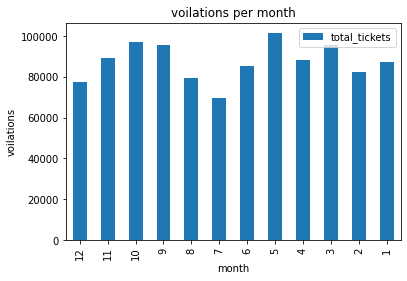

In [0]:
ticket_m= ticket.toPandas()
plt.clf
ticket_m.plot(x='month',y='total_tickets',kind='bar')
plt.title('voilations per month')
plt.xlabel('month')
plt.ylabel('voilations')
plt.show()

In [0]:
#registration_state

reg_data=sp.sql('select registration_state,count(*) as total_tickets from nycdata group by 1  order by total_tickets desc')


<Figure size 7200x14400 with 0 Axes>

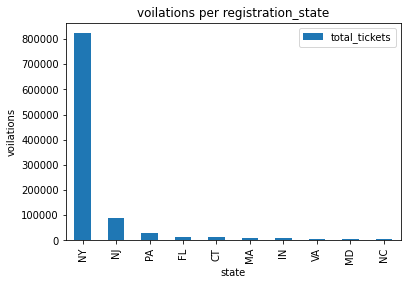

In [0]:
reg_d=reg_data.toPandas()
plt.clf
plt.figure(figsize=(100,200))
reg_d.head(10).plot(x='registration_state',y='total_tickets',kind='bar')
plt.title('voilations per registration_state')
plt.xlabel('state')
plt.ylabel('voilations')
plt.show()

examine the data 


In [0]:
%sql select violation_code, count(*) as cnt from nycdata group by 1

violation_code,cnt
31,14377
85,1907
65,19
53,3395
78,5477
81,31
27,668
26,126
44,1
12,3


In [0]:
%sql select vehicle_body_type, count(*) cnt from nycdata group by 1

vehicle_body_type,cnt
3P,5
TRUV,2
TRK,610
BOAT,247
4DSW,15
STAK,432
PU,11
NIS,5
R/RD,9
REFG,9778


In [0]:
%sql select violation_precinct, count(*) cnt from nycdata group by 1 order by 2 desc limit 6

violation_precinct,cnt
0,194041
19,52351
14,34582
1,32523
18,30156
114,29143



4. Find the violation code frequencies for three precincts that have issued the most number of tickets. Do these precinct zones have an exceptionally high frequency of certain violation codes? Are these codes common across precincts?

In [0]:
%sql select violation_code, count(*) as cnt from nycdata where violation_precinct=19
group by 1
--in (19,14,1,18,114)

violation_code,cnt
31,348
85,26
53,269
78,56
27,5
47,125
52,2
13,81
16,3073
20,2791


In [0]:
%sql select violation_code, count(*) as precinct_14 from nycdata where violation_precinct=14
group by 1

violation_code,precinct_14
31,3950
85,22
53,140
78,28
26,37
12,1
22,3
47,3063
1,31
52,53


In [0]:
%sql select violation_code, count(*) as precinct_1 from nycdata where violation_precinct=1
group by 1

violation_code,precinct_1
31,1127
53,264
78,95
26,55
47,7
13,254
16,3763
20,2862
40,833
48,344


In [0]:
%sql select violation_code, count(*) as precinct_18 from nycdata where violation_precinct=18
group by 1

violation_code,precinct_18
31,2097
53,95
78,52
26,15
47,2357
13,338
16,590
40,634
20,826
94,4


In [0]:
%sql select violation_code, count(*) as precinct_114 from nycdata where violation_precinct=114
group by 1

violation_code,precinct_114
31,14
85,187
53,34
78,159
27,25
91,7
13,31
16,84
20,2376
40,1544


In [0]:
sp.sql('select * from nycdata limit 100').show()

+--------------+--------+------------------+----------+--------------+-----------------+------------+------------------+---------------+--------------+
|summons_number|plate_id|registration_state|issue_date|violation_code|vehicle_body_type|vehicle_make|violation_precinct|issuer_precinct|violation_time|
+--------------+--------+------------------+----------+--------------+-----------------+------------+------------------+---------------+--------------+
|    1416492320| FGR5997|                NY|2016-09-30|            21|              SDN|       NISSA|                44|             44|         1150A|
|    7959486440| GYF2052|                NY|2016-07-07|            71|             4DSD|       VOLKS|               120|            120|         0645P|
|    4006478550| VAD7274|                VA|2016-10-05|             5|               4D|         BMW|                 0|              0|         0845A|
|    5092469481| GZH7067|                NY|2016-07-10|             7|             SUBN|

In [0]:
from pyspark.sql.functions import col, regexp_replace, udf, date_format

In [0]:
df.select("violation_time", col("violation_time").rlike("^[01][0-9]{3}[AP]$").alias("criteria")).where(col("criteria")=="false").show()
df.select("violation_time", col("violation_time").rlike("^[01][0-9]{3}[AP]$").alias("criteria")).where(col("criteria")=="false").count()

+--------------+--------+
|violation_time|criteria|
+--------------+--------+
|             0|   false|
|             0|   false|
|         4733P|   false|
|         2959P|   false|
|         084/A|   false|
|         6815P|   false|
|             0|   false|
|             0|   false|
|         0.22A|   false|
|             0|   false|
+--------------+--------+

Out[54]: 10

In [0]:
nycdf=df.withColumn('violation_time', regexp_replace('violation_time', '^.*[^0-9AP].*$', '0000A')).withColumn('violation_time', regexp_replace('violation_time', '^.*[^AP]$', '0000A')).withColumn('violation_time', regexp_replace('violation_time', '^[^01].*$', '0000A')).withColumn('violation_time', regexp_replace('violation_time', '^[0-9AP]{1,4}$', '0000A'))

In [0]:
nycdf.show(5)

+--------------+--------+------------------+----------+--------------+-----------------+------------+------------------+---------------+--------------+
|summons_number|plate_id|registration_state|issue_date|violation_code|vehicle_body_type|vehicle_make|violation_precinct|issuer_precinct|violation_time|
+--------------+--------+------------------+----------+--------------+-----------------+------------+------------------+---------------+--------------+
|    1416492320| FGR5997|                NY|2016-09-30|            21|              SDN|       NISSA|                44|             44|         1150A|
|    7959486440| GYF2052|                NY|2016-07-07|            71|             4DSD|       VOLKS|               120|            120|         0645P|
|    4006478550| VAD7274|                VA|2016-10-05|             5|               4D|         BMW|                 0|              0|         0845A|
|    5092469481| GZH7067|                NY|2016-07-10|             7|             SUBN|

In [0]:
print("Initially 0000A count: ",df.select("violation_time").where(col("violation_time")=="0000A").count())
print("Finally 0000A count: ", nycdf.select("violation_time").where(col("violation_time")=="0000A").count())

Initially 0000A count:  95
Finally 0000A count:  105


In [0]:
nycdf.select("violation_time", col("violation_time").rlike("^[01][0-9]{3}[AP]$").alias("criteria")).where(col("criteria")=="false").show()

+--------------+--------+
|violation_time|criteria|
+--------------+--------+
+--------------+--------+



In [0]:
from pyspark.sql.types import StringType

In [0]:
maketime_udf_str_1 = udf(lambda x: x[0:2]+':'+x[2:4]+':00' if x[-1]=="A" or int(x[0:2]) in range(13,25) else str(int(x[0:2])+12)+':'+x[2:4]+':00', StringType())

maketime_udf_str_2 = udf(lambda x: '00'+x[2:] if x[0:2]=="24" else x, StringType())
nycdf= nycdf.withColumn('violation_time_new', maketime_udf_str_1('violation_time')).withColumn('violation_time_new', maketime_udf_str_2('violation_time_new')).withColumn('violation_time_new_formatted', date_format('violation_time_new', 'H:m:s'))

nycdf.printSchema()

root
 |-- summons_number: long (nullable = true)
 |-- plate_id: string (nullable = false)
 |-- registration_state: string (nullable = false)
 |-- issue_date: date (nullable = true)
 |-- violation_code: integer (nullable = true)
 |-- vehicle_body_type: string (nullable = false)
 |-- vehicle_make: string (nullable = false)
 |-- violation_precinct: integer (nullable = true)
 |-- issuer_precinct: integer (nullable = true)
 |-- violation_time: string (nullable = false)
 |-- violation_time_new: string (nullable = true)
 |-- violation_time_new_formatted: string (nullable = true)



In [0]:
nycdf.createOrReplaceTempView("time_slots")

In [0]:
%sql select violation_code, violation_time_new_formatted, count(*) count from time_slots group by violation_code, violation_time_new_formatted

+--------------+----------------------------+-----+
|violation_code|violation_time_new_formatted|count|
+--------------+----------------------------+-----+
|            36|                     11:46:0|  382|
|            21|                       8:7:0|  861|
|            37|                     13:53:0|  179|
|             7|                     14:53:0|   64|
|            36|                      8:11:0|  162|
|            38|                     10:47:0|  157|
|            71|                      5:56:0|   11|
|            23|                      13:1:0|    3|
|            36|                     13:55:0|  321|
|             5|                      7:36:0|    9|
|            21|                      0:25:0|  335|
|            17|                     17:43:0|    8|
|            36|                      8:59:0|  303|
|            19|                      0:27:0|   44|
|            18|                      0:42:0|    2|
|            40|                      7:26:0|   61|
|           

In [0]:
result = spark.sql(
    'SELECT `violation_code`, count(*) as `number of tickets for the time bin for violation code`,  CASE WHEN HOUR(`violation_time_new_formatted`) IN ("0","1","2","3") THEN "1" WHEN HOUR(`violation_time_new_formatted`) IN ("4","5","6","7") THEN "2"  WHEN HOUR(`violation_time_new_formatted`) IN ("8","9","10","11") THEN "3"  WHEN HOUR(`violation_time_new_formatted`) IN ("12","13","14","15") THEN "4"  WHEN HOUR(`violation_time_new_formatted`) IN ("16","17","18","19") THEN "5"  WHEN HOUR(`violation_time_new_formatted`) IN ("20","21","22","23") THEN "6" END AS `violation_time_bin` FROM time_slots GROUP BY `violation_time_bin`,`violation_code`')
result.show(15)

+--------------+-----------------------------------------------------+------------------+
|violation_code|number of tickets for the time bin for violation code|violation_time_bin|
+--------------+-----------------------------------------------------+------------------+
|            61|                                                  101|                 1|
|            40|                                                 4739|                 5|
|            74|                                                 1445|                 5|
|            74|                                                 2709|                 4|
|            23|                                                  175|                 1|
|            41|                                                  210|                 3|
|            72|                                                   87|                 2|
|             1|                                                   31|                 4|
|         

In [0]:
result.createOrReplaceTempView("bins_table")

In [0]:
bin_6 = spark.sql("select violation_code from bins_table where violation_time_bin == 6 group by violation_code order by count(*) desc")
bin_6.show(3)

+--------------+
|violation_code|
+--------------+
|            31|
|            85|
|            65|
+--------------+
only showing top 3 rows



In [0]:
bin_5 = spark.sql("select violation_code from bins_table where violation_time_bin == 5 group by violation_code order by count(*) desc")
bin_5.show(3)

+--------------+
|violation_code|
+--------------+
|            31|
|            85|
|            65|
+--------------+
only showing top 3 rows



In [0]:
bin_4 = spark.sql("select violation_code from bins_table where violation_time_bin == 4 group by violation_code order by count(*) desc")
bin_4.show(3)

+--------------+
|violation_code|
+--------------+
|            31|
|            85|
|            65|
+--------------+
only showing top 3 rows



In [0]:
%sql select violation_time_bin from bins_table group by violation_time_bin order by count(*) desc 

violation_time_bin
3
5
1
4
6
2


find sesonality of data

In [0]:
byseason = spark.sql("select Violation_Code , Issuer_Precinct, case when MONTH(TO_DATE(Issue_Date, 'yyyy-mm-dd')) between 03 and 05 then 'spring' when MONTH(TO_DATE(Issue_Date, 'yyyy-mm-dd')) between 06 and 08 then 'summer' when MONTH(TO_DATE(Issue_Date, 'yyyy-mm-dd')) between 09 and 11 then 'autumn' when MONTH(TO_DATE(Issue_Date, 'yyyy-mm-dd')) in (1,2,12) then 'winter' else 'unknown' end  as season from nycdata")
byseason.show()

+--------------+---------------+------+
|Violation_Code|Issuer_Precinct|season|
+--------------+---------------+------+
|            21|             44|autumn|
|            71|            120|summer|
|             5|              0|autumn|
|             7|              0|summer|
|            36|              0|winter|
|            40|             71|summer|
|             5|              0|summer|
|            40|             73|winter|
|            38|              1|spring|
|            36|              0|autumn|
|            69|             13|autumn|
|            20|             17|spring|
|            36|              0|winter|
|            36|              0|autumn|
|            19|             18|autumn|
|            64|             17|winter|
|            78|            106|winter|
|             7|              0|summer|
|            47|             14|summer|
|             7|              0|autumn|
+--------------+---------------+------+
only showing top 20 rows



In [0]:
byseason.createOrReplaceTempView("seasonality_table")

In [0]:
%sql select season, count(*) as tickets from seasonality_table group by 1

season,tickets
winter,247193
summer,234054
spring,285546
autumn,281782


In [0]:
%sql select Violation_Code, count(*) as ticket from seasonality_table where season='autumn' group by 1 


Violation_Code,ticket
31,3420
85,475
53,846
78,1441
81,17
27,187
26,42
47,2664
1,21
52,28


In [0]:
%sql select Violation_Code, count(*) as ticket from seasonality_table where season='summer' group by 1 

Violation_Code,ticket
31,3418
85,500
65,6
53,822
78,1236
81,13
27,151
26,30
44,1
91,26


In [0]:
%sql select Violation_Code, count(*) as ticket from seasonality_table where season='winter' group by 1 

Violation_Code,ticket
31,3365
85,437
53,721
78,1344
27,167
26,22
91,22
22,3
47,2414
1,35


In [0]:
%sql select Violation_Code, count(*) as ticket from seasonality_table where season='spring' group by 1 

Violation_Code,ticket
31,4174
85,495
53,1006
78,1456
27,163
26,32
12,2
91,27
47,3517
1,28


In [0]:
%sql select Violation_Code, count(*) cnt from seasonality_table group by 1

Violation_Code,cnt
31,14377
85,1907
65,19
53,3395
78,5477
81,31
27,668
26,126
44,1
12,3


In [0]:
sp.stop()